In [1]:
import geopandas
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rioxarray
import xarray as xr
from netCDF4 import Dataset
from shapely.geometry import mapping

import rasterio
from rasterio.features import geometry_mask

In [87]:
hex_color_codes = [
    '#008180', '#00b44a', '#a2fd6e',
    '#ffffff', '#fefe53', '#fdd28a', '#ffa938', '#ec0013', '#760005'
]


In [2]:
def get_drought_class(value):
    if value <= -2.00:
        color_code = '#760005'
        rgb_code = 'rgb(118, 0, 5)'
        class_name = 'Exceptionally Dry'
    elif -2.00 <= value < -1.50:
        color_code = '#ec0013'
        rgb_code = 'rgb(236, 0, 19)'
        class_name = 'Extremely Dry'
    elif -1.50 <= value < -1.20:
        color_code = '#ffa938'
        rgb_code = 'rgb(255, 169, 56)'
        class_name = 'Severely Dry'
    elif -1.20 <= value < -0.70:
        color_code = '#fdd28a'
        rgb_code = 'rgb(253, 210, 138)'
        class_name = 'Moderately Dry'
    elif -0.70 <= value < -0.50:
        color_code = '#fefe53'
        rgb_code = 'rgb(254, 254, 83)'
        class_name = 'Abnormally Dry'
    elif -0.50 <= value < 0.50:
        color_code = '#ffffff'
        rgb_code = 'rgb(255, 255, 255)'
        class_name = 'Near Normal'
    elif 0.50 <= value < 0.70:
        color_code = '#a2fd6e'
        rgb_code = 'rgb(162, 253, 110)'
        class_name = 'Abnormally Moist'
    elif 0.70 <= value < 1.20:
        color_code = '#00b44a'
        rgb_code = 'rgb(0, 180, 74)'
        class_name = 'Moderately Moist'
    elif 1.20 <= value < 1.50:
        color_code = '#008180'
        rgb_code = 'rgb(0, 129, 128)'
        class_name = 'Very Moist'
    elif 1.50 <= value < 2.00:
        color_code = '#2a23eb'
        rgb_code = 'rgb(42, 35, 235)'
        class_name = 'Extremely Moist'
    elif value >= 2.00:
        color_code = '#a21fec'
        rgb_code = 'rgb(162, 31, 236)'
        class_name = 'Exceptionally Moist'
    else:
        color_code = None
        rgb_code = None
        class_name = None

    return color_code, rgb_code, class_name

## Visualizing Standardized Precipitation Index

In [3]:
ds = xr.open_mfdataset('../data/spi_output/mar_cli_chirps_spi_gamma_6_month.nc', parallel=True)
df = ds.to_dataframe().reset_index()
gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df["lon"],df["lat"]))

In [8]:
gdf['class'] = gdf['spi_gamma_6_month'].apply(lambda x: get_drought_class(x)[2])

In [4]:
morocco_adm0 = geopandas.read_file('../data/shapefiles/mar_adm0.shp')
morocco_adm1 = geopandas.read_file('../data/shapefiles/mar_adm1.shp')
morocco_adm2 = geopandas.read_file('../data/shapefiles/mar_adm2.shp')

Assumptions 
* Remove all areas where spi is blank


In [105]:
def count_pixels_in_polygon(polygon, transform, shape):
    mask = geometry_mask([polygon], out_shape=shape, transform=transform, invert=False)
    return mask.sum()

# Loop through the GeoDataFrame rows and count pixels for each polygon

# adm 0 = 0.061
# adm1 = 

def get_pixel_count_for_polygon(gdf, resolution):
    pixel_counts = []
    for index, row in gdf.iterrows():
        polygon = row.geometry
        minx, miny, maxx, maxy = polygon.bounds
        x_res = y_res = resolution  # Adjust this based on your data
        shape = (int((maxy - miny) // y_res), int((maxx - minx) // x_res))
        transform = rasterio.transform.from_origin(minx, maxy, x_res, y_res)
        pixel_count = count_pixels_in_polygon(polygon, transform, shape)
        pixel_counts.append(pixel_count)

    # Add pixel counts as a new column in the GeoDataFrame
    gdf['pixel_count'] = pixel_counts

    return gdf


In [ ]:
morocco_adm0 = get_pixel_count_for_polygon(morocco_adm0, 0.061)

In [60]:
gdf_adm0 = gdf.groupby(['class', 'time']).count()
gdf_adm0['percentage_area'] = 100*gdf_adm0['geometry']/16278

In [70]:
p = gdf_adm0.reset_index().set_index('time')[['class', 'percentage_area']].pivot_table(columns ='class', values='percentage_area', index = 'time')
p = p [[
    'Very Moist', 'Moderately Moist',
    'Abnormally Moist', 'Near Normal', 'Abnormally Dry', 'Moderately Dry',
    'Severely Dry', 'Extremely Dry', 'Exceptionally Dry'
]]

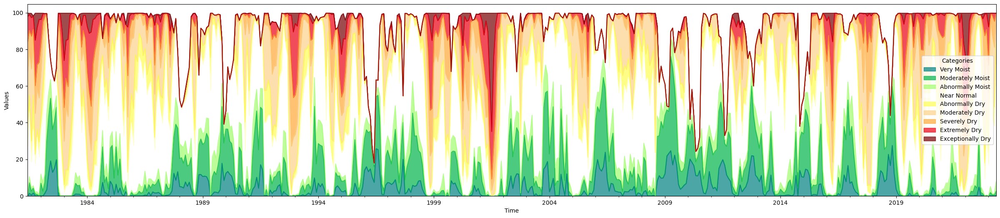

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(30,6))


p.plot(kind='area', stacked=True, alpha = 0.7, color = hex_color_codes, ax=ax)
ax.set_xlabel('Time')
ax.set_ylabel('Values')
ax.legend(title='Categories')

In [93]:
gdf_adm1 = morocco_adm1.sjoin(gdf)

c:\Users\sahit\anaconda3\envs\heatwaves\lib\site-packages\geopandas\geodataframe.py:2061: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


In [157]:
morocco_adm1 = get_pixel_count_for_polygon(morocco_adm1, 0.0436)

In [159]:
gdf_adm1 = gdf_adm1.groupby(['time', 'adm1_name', 'class']).count()

In [164]:
gdf_adm1 = gdf_adm1[['geometry']].reset_index()

In [167]:
gdf_adm1 = morocco_adm1[['adm1_name', 'pixel_count']].merge(gdf_adm1)
gdf_adm1.rename(columns = {'pixel_count':'adm_area', 'geometry':'class_area'}, inplace=True)
gdf_adm1['percentage_area'] = 100*gdf_adm1['class_area']/gdf_adm1['adm_area']

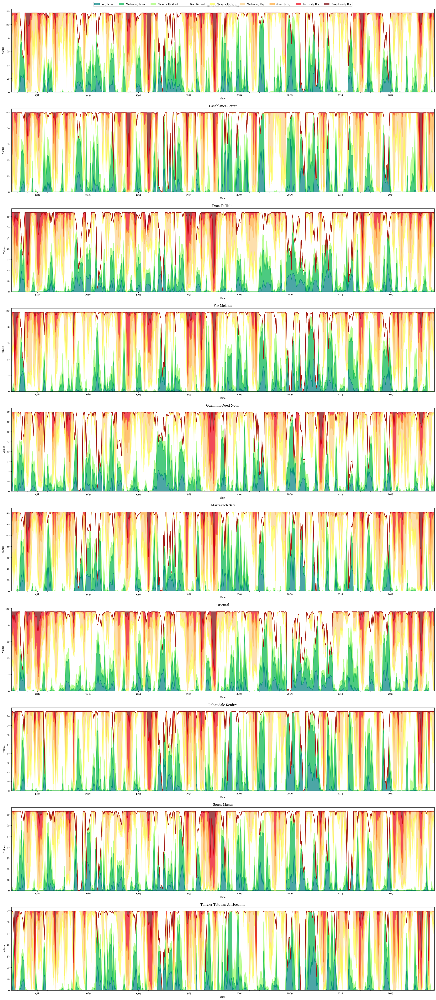

In [191]:
from matplotlib import rcParams

p = gdf_adm1[['adm1_name', 'time', 'percentage_area', 'class']]

rcParams['font.family'] = 'Georgia'
rcParams['font.sans-serif'] = ['Georgia']

fig, ax = plt.subplots(len(gdf_adm1['adm1_name'].unique()), 1, figsize=(30,70))

for i, adm in enumerate(gdf_adm1['adm1_name'].unique()):
    p1 = p[p['adm1_name']==adm]
    p1 = p1.reset_index().set_index('time')[['class', 'percentage_area']].pivot_table(columns ='class', values='percentage_area', index = 'time')
    p1 = p1 [[
    'Very Moist', 'Moderately Moist',
    'Abnormally Moist', 'Near Normal', 'Abnormally Dry', 'Moderately Dry',
    'Severely Dry', 'Extremely Dry', 'Exceptionally Dry']]

    p1.plot(kind='area', stacked=True, alpha = 0.7, color = hex_color_codes, ax=ax[i], legend = False)
    ax[i].set_xlabel('Time')
    ax[i].set_ylabel('Values')
    #ax[i].legend(title='Categories')
    ax[i].set_title(adm, fontsize=14)
 
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 11.9), fancybox=False, shadow=False, ncol=9)